In [34]:
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
import seaborn as sns
sns.set_context("paper")
sns.set_style("ticks")
import pyvista as pv

import jax
from jax import vmap, jit
import jax.numpy as jnp
import jax.random as jrandom
import gpjax as gpx
from flax import nnx  # This submodule has many of the same features as Equinox
import optax
from functools import partial
import scipy.stats.qmc as qmc

jax.config.update("jax_enable_x64", True)

# Multifidelity Gaussian process surrogates

Oftentimes, we have multiple different models for the same phenomenon, where each model has a different level of fidelity. For example, a ***high***-fidelity model could be a simulation that takes weeks/months to evaluate or a labor-intensive laboratory experiment that requires specific expertise. We might only have a handful of evaluations from the high-fidelity model. On the other hand, a ***low***-fidelity model typically involves simpler physics or coarser discretizations, and may only take minutes/hours to evaluate. We typically have much more low-fidelity data. 

It would be nice if we could somehow use the low-fidelity data to inform a surrogate for the high-fidelity model. [Kennedy and O'Hagan (2000)](https://academic.oup.com/biomet/article/87/1/1/221217) demonstrate how to do this via a **multi-fidelity Gaussian process.** Let's show how it works with a synthetic example.

## Multi-fidelity regression of a synthetic function

### Datasets

**High-fidelity data:**

Suppose we evaluate a "***high***-fidelity" model $f_h$ at several points $\mathbf{X}_h$:
$$
\begin{align*}
    \mathbf{X}_h &\equiv \begin{bmatrix} \mathbf{x}_{h,1} \\ \vdots \\ \mathbf{x}_{h,N_h} \end{bmatrix} &\in \R^{N_h \times d} \\
    \mathbf{y}_h &\equiv \begin{bmatrix} y_{h,1} \\ \vdots \\ y_{h,N_h} \end{bmatrix} 
    \equiv \begin{bmatrix} f_h(\mathbf{x}_{h,1}) \\ \vdots \\ f_h(\mathbf{x}_{h,N_h}) \end{bmatrix} &\in \R^{N_h}
\end{align*}
$$
where $N_h$ is the number of evaluations, $d$ is the input dimension, and $\mathbf{x}_{h,i} \in \R^d$ and $y_{h,i} \in \R$ are the input and output for the $i^\text{th}$ evaluation, respectively.

**Low-fidelity data:**

We also evaluate a "***low***-fidelity" model at $f_\ell$ at the same points $\mathbf{X}_h$ ***and*** at some different points $\mathbf{X}_\ell' \in \R^{N_\ell' \times d}$:
$$
\begin{align*}
    \mathbf{y}^{\text{same}}_\ell &\equiv \begin{bmatrix} f_\ell(\mathbf{x}_{h,1}) \\ \vdots \\ f_\ell(\mathbf{x}_{h,N_h}) \end{bmatrix} &\in \R^{N_h} \\
    \mathbf{y}^{\text{diff}}_\ell &\equiv \begin{bmatrix} f_\ell(\mathbf{x}_{\ell,1}) \\ \vdots \\ f_\ell(\mathbf{x}_{\ell,N_\ell'}) \end{bmatrix} &\in \R^{N_\ell'}
\end{align*}
$$

Let's visualize this with a synthetic example:

In [2]:
def high_fidelity_model(x):
    x1, x2 = x[0], x[1]
    return 1/2*jnp.sin(5/2*x1 + 2/3*x2)**2 + 2/3*jnp.exp(-x1*(x2 - 0.5)**2)*jnp.cos(4*x1 + x2)**2

def low_fidelity_model(x):
    x1, x2 = x[0], x[1]
    return 2.5*high_fidelity_model(x) + 1/3*( jnp.sin(x1 + x2) + 1/2*jnp.exp(-x1)*jnp.sin(x1 + 7*x2) )

def generate_synthetic_data(n_l, n_h, n_test, key=None):
    """Returns a train and test set."""

    # Train data
    x_train_l_only = jnp.array(qmc.LatinHypercube(2).random(n=n_l - n_h))
    x_train_h = jnp.array(qmc.LatinHypercube(2).random(n_h))
    y_train_l_only = vmap(low_fidelity_model)(x_train_l_only)
    y_train_l_common = vmap(low_fidelity_model)(x_train_h)
    y_train_h = vmap(high_fidelity_model)(x_train_h)
    x_train_l = jnp.concatenate([x_train_l_only, x_train_h], axis=0)  # low fidelity inputs points should also include all the high fidelity input points
    y_train_l = jnp.concatenate([y_train_l_only, y_train_l_common], axis=0) 

    # Test data
    x_test = jrandom.uniform(key, (n_test, 2))
    y_test_l = vmap(low_fidelity_model)(x_test)
    y_test_h = vmap(high_fidelity_model)(x_test)

    # D_low_only = gpx.Dataset(x_train_l_only, y_train_l_only[:, None])
    D_low_common = gpx.Dataset(x_train_h, y_train_l_common[:, None])
    D_low = gpx.Dataset(x_train_l, y_train_l[:, None])
    D_high = gpx.Dataset(x_train_h, y_train_h[:, None])
    D_low_test = gpx.Dataset(x_test, y_test_l[:, None])
    D_high_test = gpx.Dataset(x_test, y_test_h[:, None])

    return D_low_common, D_low, D_high, D_low_test, D_high_test

In [21]:
N_LOW_FIDELITY = 50
N_HIGH_FIDELITY = 10
N_TEST = 100
SEED = 1

key, subkey = jrandom.split(jrandom.PRNGKey(SEED))
D_low_common, D_low, D_high, D_low_test, D_high_test = generate_synthetic_data(N_LOW_FIDELITY, N_HIGH_FIDELITY, N_TEST, key=subkey)

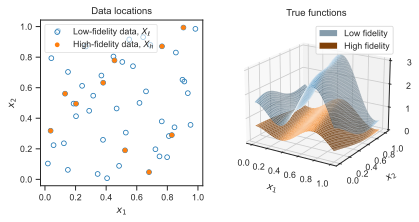

In [22]:
fig = plt.figure()
ax = fig.add_subplot(121)
ax.scatter(D_low.X[:,0], D_low.X[:, 1], label=r'Low-fidelity data, $X_\ell$', marker='o', facecolors='none', edgecolors='tab:blue')
ax.scatter(D_high.X[:,0], D_high.X[:, 1], label=r'High-fidelity data, $X_h$', marker='o', facecolors='tab:orange', edgecolors='none')
ax.set_aspect('equal')
ax.set_title('Data locations')
ax.set_xlabel(r'$x_1$')
ax.set_ylabel(r'$x_2$')
leg = ax.legend()
leg.get_frame().set_alpha(0.6)

x1, x2 = jnp.linspace(0, 1, 100), jnp.linspace(0, 1, 100)
X1, X2 = jnp.meshgrid(x1, x2)
Y_low = vmap(low_fidelity_model)(jnp.stack([X1.ravel(), X2.ravel()], axis=-1)).reshape(X1.shape)
Y_high = vmap(high_fidelity_model)(jnp.stack([X1.ravel(), X2.ravel()], axis=-1)).reshape(X1.shape)

ax = fig.add_subplot(122, projection='3d')
ax.plot_surface(X1, X2, Y_low, label='Low fidelity', lw=0.1, alpha=0.5)
ax.plot_surface(X1, X2, Y_high, label='High fidelity', lw=0.1)
ax.view_init(elev=20, azim=-58)
ax.set_title('True functions')
ax.set_xlabel(r'$x_1$')
ax.set_ylabel(r'$x_2$')
ax.set_zlabel(r'$y$')
ax.legend();

For ease of notation, let's group all the low-fidelity data together: 
$$
\begin{align*}
    \mathbf{X_\ell} &\equiv \begin{bmatrix} \mathbf{X}_h \\ \mathbf{X}_\ell' \end{bmatrix} &\in \R^{N_\ell \times d}  \\
    \mathbf{y_\ell} &\equiv \begin{bmatrix} \mathbf{y}^{\text{same}}_\ell \\ \mathbf{y}^{\text{diff}}_\ell \end{bmatrix} &\in \R^{N_\ell}
\end{align*}
$$
where $N_\ell = N_h + N_\ell'$ is the total number of low-fidelity evaluations.

<!-- We now have low and high fidelity datasets $D_\ell \equiv ( \mathbf{x}_\ell, \mathbf{y}_\ell )$ and $D_h \equiv ( \mathbf{x}_h, \mathbf{y}_h )$, respectively. -->

<!-- For simplicity, assume we have low-fidelity data at every location where we have high-fidelity data, i.e., $\mathbf{x}_h \subset \mathbf{x}_\ell$. Let's generate the data for this synthetic example: -->

<!-- Our goal is to approximate the "***high***-fidelity" model $f_h$ with a multi-fidelity Gaussian process.

$$
f_h(\mathbf{x}) = \frac{1}{2} \sin\left( \frac{5}{2} x_1 + \frac{2}{3} x_2 \right)^2 + \frac{2}{3} e^{-x_1 (x_2 - \frac{1}{2})^2} \cos(4x_1 + x_2)^2
$$

given by
$$
f_\ell(\mathbf{x}) = 1.5 f_h(\mathbf{x}) + \frac{1}{3} \sin(x_1 + x_2) + \frac{1}{2} e^{-x_1} \sin(x_1 + 7x_2)
$$ -->

### Low-fidelity Gaussian process

We start by making a Gaussian process surrogate $\hat{f}_\ell$ using just the low-fidelity data: 
$$
\hat{f}_\ell(\cdot) \sim GP\Big(\bm{0}(\cdot), k(\cdot, \cdot)\Big) \\
$$
Let the covariance kernel $k$ be the radial basis function (RBF) kernel
whose variance, $\sigma^2$, and lengthscale, $\ell_d$, are found by maximizing the marginal log likelihood, i.e.,
$$
\sigma^2, \ell_d = \arg\max_{\sigma^2, \ell_d} \log p(\mathbf{y}_\ell | \mathbf{x}_\ell, \sigma^2, \ell_d)
$$

<!-- $$
k(\mathbf{x}, \mathbf{x}') = \sigma^2 \exp\left( -\frac{1}{2} \sum_{d=1}^D \left( \frac{x_d - x'_d}{\ell_d} \right)^2 \right)
$$ --> 

Let's do this in GPJax:

In [23]:
# Construct low-fidelity GP
mean_low = gpx.mean_functions.Zero()
kernel_low = gpx.kernels.RBF(lengthscale=jnp.ones(2), variance=1.0)
prior_low = gpx.gps.Prior(mean_function=mean_low, kernel=kernel_low)
likelihood_low = gpx.likelihoods.Gaussian(
    num_datapoints=D_low.n, 
    obs_stddev=1.0, #gpx.parameters.PositiveReal(1.0, tag="Static")
)
posterior_low = prior_low * likelihood_low

# Loss function
negative_mll = lambda p, d: -gpx.objectives.conjugate_mll(p, d)
# negative_log_posterior_density = lambda p, d: -gpx.objectives.log_posterior_density(p, d)

# Optimize low-fidelity hyperparameters
posterior_low, history_low = gpx.fit_scipy(
    model=posterior_low,
    objective=negative_mll,
    train_data=D_low,
    max_iters=1000
)

         Current function value: -118.751325
         Iterations: 50
         Function evaluations: 107
         Gradient evaluations: 97


/Users/holtw/Documents/mydocs/software/advanced-scientific-machine-learning/.venv/lib/python3.11/site-packages/scipy/optimize/_minimize.py:726: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


Let's visualize the fit to the *low*-fidelity data with a parity plot:

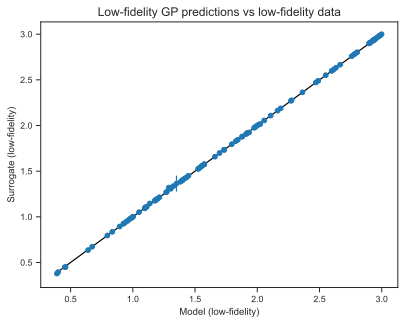

In [59]:
def generate_predictive_dist(x, posterior, train_data):
    latent_dist = posterior.predict(x, train_data=train_data)
    return posterior.likelihood(latent_dist)

predictive_dist_low = generate_predictive_dist(D_low_test.X, posterior_low, D_low)
mean_low_test = predictive_dist_low.mean()
std_low_test = predictive_dist_low.stddev()

fig, ax = plt.subplots()
ax.errorbar(D_low_test.y, mean_low_test, yerr=2 * std_low_test, fmt="o")
ax.plot(D_low_test.y, D_low_test.y, "k--")
ax.set_xlabel("Model (low-fidelity)")
ax.set_ylabel("Surrogate (low-fidelity)")
ax.set_title(r"Low-fidelity GP predictions vs low-fidelity data", fontsize=12);

It looks good. Now onto multi-fidelity.

### Multi-fidelity Gaussian process

The idea behind the multi-fidelity GP is this: Do GP regression on the high-fidelity data, but **add a dimension to the input space which represents the output of the low-fidelity model**. 

More precisely, the multi-fidelity GP is
$$
\hat{f}_m(\cdot) \sim GP\Big(\bm{0}(\cdot), k_m(\cdot, \cdot)\Big) \\
$$
where
$$
k_m(\mathbf{x}, \mathbf{x}') \equiv k\left( ~ \left[\mathbf{x} \quad \hat{f}_\ell(\mathbf{x})\right] ~ , ~~ \left[\mathbf{x}' \quad \hat{f}_\ell(\mathbf{x}')\right] ~ \right)
$$
is the multi-fidelity covariance kernel.
Note that the covariance kernel $k_m$ itself has a Gaussian process $(\hat{f}_\ell)$ inside of it! This is how low-fidelity information is passed to $\hat{f}_m$. Intuitively, the multi-fidelity GP automatically "learns" how to correct the low-fidelity model's predictions.

The data for training the multi-fidelity GP are
$$
\begin{align}
    \mathbf{X}_m 
    &= [ 
        \underbrace{\mathbf{X}_h}_{\substack{\text{high-fidelity} \\ \text{input points}}} 
        \quad 
        \underbrace{\mathbf{y}^\text{same}_\ell}_{\substack{\text{low-fidelity model} \\ \text{evaluated at } \mathbf{X}_h}} 
    ] 
    &\in \R^{N_h \times d+1} \\
    \mathbf{y}_m 
    &= \underbrace{\mathbf{y}_h}_{\substack{\text{high-fidelity model} \\ \text{evaluated at } \mathbf{X}_h}}
    &\in \R^{N_h}.
\end{align}
$$
You can think of this as a form of *data augmentation* (we simply augment the high-fidelity dataset with some low-fidelity model evaluations at the same points).

Let's try this out. Here is a GP constructed with the new augmented dataset $(\mathbf{X}_m$, $\mathbf{y}_m)$:

In [25]:
Xm = jnp.concatenate([D_high.X, D_low_common.y], axis=1)
ym = D_high.y
D_multi = gpx.Dataset(Xm, ym)

# Construct multi-fidelity GP
mean_multi = gpx.mean_functions.Zero()
kernel_multi = gpx.kernels.RBF(lengthscale=jnp.ones(3), variance=1.0)
prior_multi = gpx.gps.Prior(mean_function=mean_multi, kernel=kernel_multi)
likelihood_multi = gpx.likelihoods.Gaussian(
    num_datapoints=D_multi.n, 
    obs_stddev=1.0
)
posterior_multi = prior_multi * likelihood_multi

# Optimize multi-fidelity hyperparameters
posterior_multi, history_multi = gpx.fit_scipy(
    model=posterior_multi,
    objective=negative_mll,
    train_data=D_multi,
    max_iters=1000
)

Optimization terminated successfully.
         Current function value: -10.610802
         Iterations: 35
         Function evaluations: 40
         Gradient evaluations: 40


Note that this is now a 3D-input GP instead of a 2D-input GP (due to the augmented dimension). 

The next question is **how do we sample the multi-fidelity GP at some test input $\mathbf{x}_\text{test}$?** Here is how:

1. First, get a sample $y_{\ell,\text{test}}=\hat{f}_\ell(\mathbf{x}_\text{test})$ from the low-fidelity GP.

In [26]:
x_test = jnp.array([[0.5, 0.5]])
predictive_dist_low_test = generate_predictive_dist(x_test, posterior_low, D_low)
key, subkey = jrandom.split(key)
samples_low_test = predictive_dist_low_test.sample((), subkey)

2. Next, augment the input like $\mathbf{x}_\text{test}^\text{aug} = [ \mathbf{x}_\text{test} \quad y_{\ell,\text{test}} ]$.

In [27]:
x_augmented = jnp.concatenate([x_test, samples_low_test[:, None]], axis=-1)

3. Finally, use $\mathbf{x}_\text{test}^\text{aug}$ to get a sample $y_{m,\text{test}} = \hat{f}_m(\mathbf{x}_\text{test})$ from the multi-fidelity GP.

In [28]:
predictive_dist_multi_test = generate_predictive_dist(x_augmented, posterior_multi, D_multi)
samples_multi_test = predictive_dist_multi_test.sample((), key)
print(f'The sample is:     {samples_multi_test.squeeze():.4f}')
print(f'The true value is: {high_fidelity_model(x_test[0]):.4f}')

The sample is:     0.9295
The true value is: 0.9278


And that's it! We know know how to construct and evaluate a multi-fidelity GP surrogate. 
Next, we'll check our surrogate's accuracy. 

Before we do that, however, let's train a vanilla GP on the high-fidelity data for comparison:

In [60]:
# Construct high-fidelity GP
mean_high = gpx.mean_functions.Zero()
kernel_high = gpx.kernels.RBF(lengthscale=jnp.ones(2), variance=1.0)
prior_high = gpx.gps.Prior(mean_function=mean_high, kernel=kernel_high)
likelihood_high = gpx.likelihoods.Gaussian(
    num_datapoints=D_high.n, 
    obs_stddev=1.0
)
posterior_high = prior_high * likelihood_high

# Optimize multi-fidelity hyperparameters
posterior_high, history_high = gpx.fit_scipy(
    model=posterior_high,
    objective=negative_mll,
    train_data=D_high,
    max_iters=1000
)

Optimization terminated successfully.
         Current function value: -1.813716
         Iterations: 56
         Function evaluations: 62
         Gradient evaluations: 62


Let's also wrap the sampling code into functions (for organization):

In [46]:
def sample_multi_fidelity_gp(
    X, 
    key, 
    num_samples,
    posterior_low=posterior_low, 
    posterior_multi=posterior_multi, 
    D_low=D_low,
    D_multi=D_multi
):
    """Sample from the multi-fidelity Gaussian process.
    
    Parameters
    ----------
    X : ndarray
        The test points.
    posterior_low : gpx.gps.Posterior
        The low-fidelity GP posterior.
    posterior_multi : gpx.gps.Posterior
        The multi-fidelity GP posterior.
    key : PRNGKey
        The random key.
    num_samples : int
        The number of samples to draw.
    D_low : gpx.Dataset
        The low-fidelity dataset.
    D_multi : gpx.Dataset
        The multi-fidelity dataset.

    Returns
    -------
    ndarray
        The samples from the multi-fidelity GP. The shape is (num_samples, num_test_points).
    """
    predictive_dist_low = generate_predictive_dist(X, posterior_low, D_low)
    samples_low_test = predictive_dist_low.sample((num_samples,), key)
    single_augment_fn = lambda yl: jnp.concatenate([X, yl[:, None]], axis=-1)
    x_aug = vmap(single_augment_fn)(samples_low_test)  # This is now shape (num_samples, num_test_points, d)
    x_aug_flat = x_aug.reshape(-1, X.shape[-1] + 1)  # This is now shape (num_samples*num_test_points, d)
    predictive_dist_multi = generate_predictive_dist(x_aug_flat, posterior_multi, D_multi)
    samples_multi_test = predictive_dist_multi.sample((), key).reshape(num_samples, X.shape[0])
    return samples_multi_test

def sample_vanilla_gp(
    X,
    key,
    num_samples,
    posterior,
    D
):
    """Sample from a vanilla GP.

    Parameters
    ----------
    X : ndarray
        The test points.
    key : PRNGKey
        The random key.
    num_samples : int
        The number of samples to draw.
    posterior : gpx.gps.Posterior
        The GP posterior.
    D : gpx.Dataset
        The dataset.
    """
    predictive_dist = generate_predictive_dist(X, posterior, D)
    samples = predictive_dist.sample((num_samples,), key)
    return samples

Now, we are ready to see how well the GPs predict the test data:

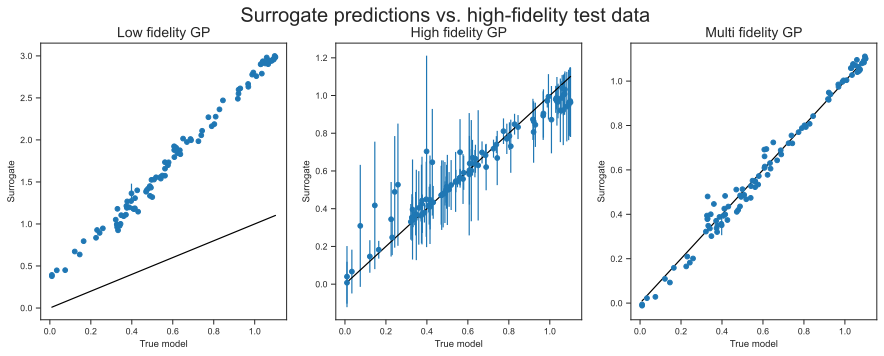

In [55]:
sample_high_fidelity_gp = partial(sample_vanilla_gp, posterior=posterior_high, D=D_high)
sample_low_fidelity_gp = partial(sample_vanilla_gp, posterior=posterior_low, D=D_low)
sample_multi_fidelity_gp = partial(sample_multi_fidelity_gp, posterior_low=posterior_low, posterior_multi=posterior_multi, D_low=D_low, D_multi=D_multi)

num_samples = 50
X_test = D_high_test.X
samples_low = sample_low_fidelity_gp(X_test, key, num_samples)
samples_high = sample_high_fidelity_gp(X_test, key, num_samples)
samples_multi = sample_multi_fidelity_gp(X_test, key, num_samples)

mean_low_test = samples_low.mean(axis=0)
std_low_test = samples_low.std(axis=0)
mean_high_test = samples_high.mean(axis=0)
std_high_test = samples_high.std(axis=0)
mean_multi_test = samples_multi.mean(axis=0)
std_multi_test = samples_multi.std(axis=0)

# Parity plot - add uncertainty on predictions using whiskers
fig, ax = plt.subplots(1, 3, figsize=(15,5))
fig.suptitle("Surrogate predictions vs. high-fidelity test data", fontsize=20)
ax[0].errorbar(D_high_test.y, mean_low_test, yerr=2 * std_low_test, fmt="o")
ax[0].plot(D_high_test.y, D_high_test.y, "k--")
ax[0].set_xlabel("True model")
ax[0].set_ylabel("Surrogate")
ax[0].set_title("Low fidelity GP", fontsize=14)

ax[1].errorbar(D_high_test.y, mean_high_test, yerr=2 * std_high_test, fmt="o")
ax[1].plot(D_high_test.y, D_high_test.y, "k--")
ax[1].set_xlabel("True model")
ax[1].set_ylabel("Surrogate")
ax[1].set_title("High fidelity GP", fontsize=14)

ax[2].errorbar(D_high_test.y, mean_multi_test, yerr=2 * std_multi_test, fmt="o")
ax[2].plot(D_high_test.y, D_high_test.y, "k--")
ax[2].set_xlabel("True model")
ax[2].set_ylabel("Surrogate")
ax[2].set_title("Multi fidelity GP", fontsize=14);

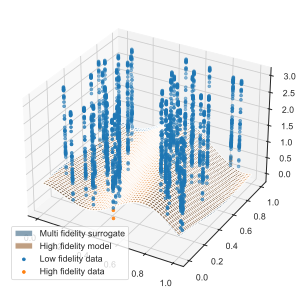

In [66]:
def generate_predictive_dist(x, posterior, train_data):
    latent_dist = posterior.predict(x, train_data=train_data)
    return posterior.likelihood(latent_dist)

x1_plt, x2_plt = jnp.meshgrid(jnp.linspace(0, 1, 50), jnp.linspace(0, 1, 50))
x_plt_flat = jnp.stack([x1_plt.flatten(), x2_plt.flatten()], axis=-1)
low_fidelity_plt = low_fidelity_model(x_plt_flat.T)
ground_truth_plt = high_fidelity_model(x_plt_flat.T)

predictive_dist_low = generate_predictive_dist(x_plt_flat, posterior_low, D_low)
key, subkey = jrandom.split(key)
sample_low = posterior_low.sample_approx(num_samples=1, train_data=D_low, key=subkey)(x_plt_flat).squeeze(-1)
augmented_input = jnp.concatenate([x_plt_flat, sample_low[:, None]], axis=-1)
# augmented_input = jnp.concatenate([x_plt_flat, predictive_dist_low.mean()[:, None]], axis=-1)
predictive_dist_multi = generate_predictive_dist(augmented_input, posterior_multi, D_multi)
# latent_dist_low = posterior_low.predict(x_plt_flat, train_data=Dl)
# predictive_dist_low = posterior_low.likelihood(latent_dist_low)

mean_multi = predictive_dist_multi.mean()
std_multi = predictive_dist_multi.stddev()
# sample_multi = predictive_dist_multi.sample((), key)
func_samples_multi = posterior_multi.sample_approx(num_samples=1, train_data=D_multi, key=subkey)
sample_multi = func_samples_multi(augmented_input).squeeze(-1)
error = jnp.abs(mean_multi - ground_truth_plt)

fig = plt.figure(figsize=(5,5), dpi=150)
ax = fig.add_subplot(111, projection='3d')
# ax.plot_surface(x1_plt, x2_plt, sample_multi.reshape(x1_plt.shape), alpha=0.5, color='tab:blue', label='Multi fidelity surrogate')
ax.plot_surface(x1_plt, x2_plt, mean_multi.reshape(x1_plt.shape), alpha=0.5, color='tab:blue', label='Multi fidelity surrogate')
ax.plot_surface(x1_plt, x2_plt, ground_truth_plt.reshape(x1_plt.shape), alpha=0.5, color='tab:orange', label='High fidelity model')
ax.scatter3D(D_low.X[:,0], D_low.X[:, 1], D_low.y, s=8, label='Low fidelity data', color='tab:blue')
ax.scatter3D(D_high.X[:,0], D_high.X[:, 1], D_high.y, s=8, label='High fidelity data', color='tab:orange')
ax.legend();

ground_truth_plt.max()
vmin = 0.0
vmax = 1.2

fig, axes = plt.subplots(2, 4, figsize=(13,6), dpi=150, sharex=True, sharey=True)
ax = axes.flatten()

p = ax[0].pcolormesh(x1_plt, x2_plt, error.reshape(x1_plt.shape), vmin=vmin, vmax=vmax)
fig.colorbar(p, ax=ax[0])
ax[0].set_title('Absolute error')

p = ax[1].pcolormesh(x1_plt, x2_plt, mean_multi.reshape(x1_plt.shape), vmin=vmin, vmax=vmax)
cbar = fig.colorbar(p, ax=ax[1])
ax[1].set_title('Predictive mean')

p = ax[2].pcolormesh(x1_plt, x2_plt, ground_truth_plt.reshape(x1_plt.shape), vmin=vmin, vmax=vmax)
cbar = fig.colorbar(p, ax=ax[2])
ax[2].set_title('Ground truth')

p = ax[3].pcolormesh(x1_plt, x2_plt, low_fidelity_plt.reshape(x1_plt.shape))
cbar = fig.colorbar(p, ax=ax[3])
ax[3].set_title('Low fidelity model')

sample_multi = posterior_multi.sample_approx(num_samples=4, train_data=D_multi, key=subkey)(augmented_input)
for i, s in enumerate(sample_multi.T):
    p = ax[i+4].pcolormesh(x1_plt, x2_plt, s.reshape(x1_plt.shape), vmin=vmin, vmax=vmax)
    cbar = fig.colorbar(p, ax=ax[i+4])
    ax[i+4].set_title(f'Sample {i+1}')

In [342]:
x1_plt = jnp.linspace(0, 1, 100)
x_plt = jnp.stack([x1_plt, jnp.ones_like(x1_plt)*0.2], axis=-1)
s_plt = func_samples_multi(x_plt)

fig, ax = plt.subplots()
ax.plot(x1_plt, s_plt, 'tab:blue', alpha=0.5)

TypeError: dot_general requires contracting dimensions to have the same shape, got (2,) and (3,).

TODO: I think this is now working! need to check against high fidelity model. Make plots comparing all 3 surrogates.

In [298]:
# TODO: Do high fidelity
# TODO: Organize into functions?

In [105]:
def make_step(posterior_state, optim_state, key, train_data_low, train_data_high, train_data_multi, optim, posterior_graphdef):
    key, key_low = jrandom.split(key, 2)

    # Sample the low fidelity GP
    y_low = generate_predictive_dist(train_data_low.X, posterior_low, train_data_low).sample((), key_low)

    # Augment the input with the low fidelity GP output
    x_multi = jnp.concatenate([train_data_low.X, y_low[:, None]], axis=-1)

    # Sample the multi-fidelity GP
    posterior_multifid = nnx.merge(posterior_graphdef, posterior_state)
    y_multi = generate_predictive_dist(x_multi, posterior_multifid, train_data_multifid).sample((), key)

    # Compute the loss gradient
    # TODO: Understand the conjugate_mll function
    loss_fn = lambda s, d: -gpx.objectives.conjugate_mll(nnx.merge(posterior_graphdef, s), d)
    loss, grads = jax.value_and_grad(loss_fn)(posterior_state, train_data_multi)

    # Update the multi-fidelity GP hyperparams
    optim_state = optim.update(grads, optim_state)
    posterior_state = optax.apply_updates(posterior_state, optim_state)

    return posterior_state, optim_state, loss

In [106]:
posterior_graphdef, posterior_state = nnx.split(posterior_multifid)
optim = optax.adam(1e-3)
optim_state = optim.init(posterior_state)
key, subkey = jrandom.split(key)

make_step(
    posterior_state,
    optim_state,
    subkey,
    D_low,
    D_high,
    D_multi,
    optim,
    posterior_graphdef
)

ValueError: Custom node type mismatch: expected type: <class 'flax.nnx.nnx.state.State'>, value: (State({
  'likelihood': {
    'obs_stddev': VariableState(
      type=PositiveReal,
      value=Array(-0.001, dtype=float64),
      _tag='positive'
    )
  },
  'prior': {
    'kernel': {
      'lengthscale': VariableState(
        type=PositiveReal,
        value=Array([0.001, 0.001, 0.001], dtype=float64),
        _tag='positive'
      ),
      'variance': VariableState(
        type=PositiveReal,
        value=Array(-0.001, dtype=float64),
        _tag='positive'
      )
    },
    'mean_function': {
      'constant': VariableState(
        type=Real,
        value=Array(0.001, dtype=float64),
        _tag='real'
      )
    }
  }
}), (ScaleByAdamState(count=Array(1, dtype=int32), mu=State({
  'likelihood': {
    'obs_stddev': VariableState(
      type=PositiveReal,
      value=Array(1.17059822, dtype=float64, weak_type=True),
      _tag='positive'
    )
  },
  'prior': {
    'kernel': {
      'lengthscale': VariableState(
        type=PositiveReal,
        value=Array([-0.04411523, -0.04336494, -0.06259556], dtype=float64),
        _tag='positive'
      ),
      'variance': VariableState(
        type=PositiveReal,
        value=Array(0.12988794, dtype=float64, weak_type=True),
        _tag='positive'
      )
    },
    'mean_function': {
      'constant': VariableState(
        type=Real,
        value=Array(-0.07074412, dtype=float64, weak_type=True),
        _tag='real'
      )
    }
  }
}), nu=State({
  'likelihood': {
    'obs_stddev': VariableState(
      type=PositiveReal,
      value=Array(0.13703002, dtype=float64, weak_type=True),
      _tag='positive'
    )
  },
  'prior': {
    'kernel': {
      'lengthscale': VariableState(
        type=PositiveReal,
        value=Array([0.00019462, 0.00018805, 0.00039182], dtype=float64),
        _tag='positive'
      ),
      'variance': VariableState(
        type=PositiveReal,
        value=Array(0.00168709, dtype=float64, weak_type=True),
        _tag='positive'
      )
    },
    'mean_function': {
      'constant': VariableState(
        type=Real,
        value=Array(0.00050047, dtype=float64, weak_type=True),
        _tag='real'
      )
    }
  }
})), EmptyState())).

In [67]:
# key, key_l, key_h, key_m = jrandom.split(key, 4)

# latent_dist_low = posterior_low.predict(x_test, train_data=Dl)
# predictive_dist_low = posterior_low.likelihood(latent_dist_low)

# mean_low = predictive_dist_low.mean()
# std_low = predictive_dist_low.stddev()
# sample_low = predictive_dist_low.sample((), key_l)

# # Parity plot - add uncertainty on predictions using whiskers
# fig, ax = plt.subplots()
# ax.errorbar(y_test, mean_low, yerr=2 * std_low, fmt="o")
# ax.plot(y_test, y_test, "k--")
# ax.set_xlabel("True AI")
# ax.set_ylabel("Predicted AI")
# ax.set_title("Low fidelity")

In [23]:
# def construct_posterior_gp(
#     train_data, 
#     lengthscale, 
#     variance, 
#     obs_stddev,
#     mean=None,
# ):
#     if mean is None:
#         mean = gpx.mean_functions.Zero()
#     kernel = gpx.kernels.RBF(lengthscale=jnp.array(lengthscale), variance=jnp.array(variance))
#     prior = gpx.gps.Prior(mean_function=mean, kernel=kernel)
#     likelihood = gpx.likelihoods.Gaussian(
#         num_datapoints=train_data.n, 
#         obs_stddev=obs_stddev
#     )
#     posterior = prior * likelihood
#     return posterior

# # def optimize_hyperparameters(
# #     fit_method='scipy',  # scipy or optax
# #     max_iter=1000,
# # ):
# #     negative_mll = lambda p, d: -gpx.objectives.conjugate_mll(p, d)
# #     if fit_method == 'optax':
# #         optimizer = optax.adam(1e-3)
# #         posterior, history = gpx.fit(
# #             model=posterior,
# #             objective=negative_mll,
# #             train_data=train_data,
# #             optim=optimizer,
# #             num_iters=max_iter
# #         )
# #     elif fit_method == 'scipy':
# #         posterior, history = gpx.fit_scipy(
# #             model=posterior,
# #             objective=negative_mll,
# #             train_data=train_data,
# #             max_iters=max_iter
# #         )
    

# # TODO: How do I optimize the hyperparameters of the high fidelity GP?
# # 1. Define a HighFidelityGPKernel where the I use the mean of the inner GP and do a deterministic optimization for the hyparparams.
# # 2. Keep the same stochastic kernel and use ADAM to optimize the outer hyperparams. I AM LEANING TOWARDS THIS ONE!

# # # TODO: Implement the kernel this way. All hyperparameters defined so that we can optimize them
# # class HighFidelityKernel(gpx.kernels.AbstractKernel):
# #     lengthcale: PositiveReal
# #     ...

# # TODO: Delete this version of the kernel
# # class HighFidelityGPKernel(gpx.kernels.RBF):
# #     def __init__(self, *args, low_fidelity_gp_posterior=None, low_fidelity_train_data=None, **kwargs):
# #         super().__init__(*args, **kwargs)
# #         self.low_fidelity_gp_posterior = low_fidelity_gp_posterior
# #         self.low_fidelity_train_data = low_fidelity_train_data
    
# #     def __call__(self, x, y, key):
# #         low_fidelity_predictive_dist_x = construct_predictive_dist(self.low_fidelity_gp_posterior, x, self.low_fidelity_train_data)
# #         low_fidelity_predictive_dist_y = construct_predictive_dist(self.low_fidelity_gp_posterior, y, self.low_fidelity_train_data)
# #         x_ = jnp.concatenate([x, low_fidelity_predictive_dist_x.sample((), key)], axis=-1)
# #         y_ = jnp.concatenate([x, low_fidelity_predictive_dist_y.sample((), key)], axis=-1)
# #         return super().__call__(x_, y_)

# class HighFidelityKernel(gpx.kernels.RBF):
#     def __init__(self, *args, key, **kwargs):
#         super().__init__(*args, **kwargs)
#         self.key = key
    
#     def __call__(self, x, y):
#         low_fidelity_predictive_dist_x = construct_predictive_dist(self.low_fidelity_gp_posterior, x, self.low_fidelity_train_data)
#         low_fidelity_predictive_dist_y = construct_predictive_dist(self.low_fidelity_gp_posterior, y, self.low_fidelity_train_data)
#         x_ = jnp.concatenate([x, low_fidelity_predictive_dist_x.sample((), self.key)], axis=-1)
#         y_ = jnp.concatenate([x, low_fidelity_predictive_dist_y.sample((), self.key)], axis=-1)
#         return super().__call__(x_, y_)

# class GPMeanFunction(gpx.mean_functions.AbstractMeanFunction):
#     def __init__(self, low_fidelity_gp_posterior=None, low_fidelity_train_data=None):
#         self.low_fidelity_gp_posterior = low_fidelity_gp_posterior
#         self.low_fidelity_train_data = low_fidelity_train_data
    
#     def __call__(self, x):
#         low_fidelity_predictive_dist = construct_predictive_dist(self.low_fidelity_gp_posterior, x, self.low_fidelity_train_data)
#         return low_fidelity_predictive_dist.mean()

# def construct_multifidelity_posterior_gp(
#     *,
#     train_data_low,
#     train_data_high,
#     lengthscale_low,
#     lengthscale_high,
#     variance_low,
#     variance_high,
#     obs_stddev_low,
#     obs_stddev_high
# ):
#     # Construct low-fidelity GP
#     mean_low = gpx.mean_functions.Zero()
#     kernel_low = gpx.kernels.RBF(lengthscale=jnp.array(lengthscale_low), variance=jnp.array(variance_low))
#     prior_low = gpx.gps.Prior(mean_function=mean_low, kernel=kernel_low)
#     likelihood_low = gpx.likelihoods.Gaussian(
#         num_datapoints=train_data_low.n, 
#         obs_stddev=obs_stddev_low
#     )
#     posterior_low = prior_low * likelihood_low

#     # Optimize low-fidelity hyperparameters
#     posterior_low = gpx.fit_scipy(
#         model=posterior_low,
#         objective=negative_mll,
#         train_data=train_data_low,
#         max_iters=1000
#     )
    
#     # Define high-fidelity GP
#     # mean_high = GPMeanFunction(low_fidelity_gp_posterior=posterior_low, low_fidelity_train_data=train_data_low)
#     mean_high = gpx.mean_functions.Zero()
#     kernel_high = gpx.kernels.RBF(lengthscale=jnp.array(lengthscale_high), variance=jnp.array(variance_high))  # This needs to be reinitialized every sample
#     prior_high = gpx.gps.Prior(mean_function=mean_high, kernel=kernel_high)
#     likelihood_high = gpx.likelihoods.Gaussian(
#         num_datapoints=train_data_high.n, 
#         obs_stddev=obs_stddev_high
#     )
#     posterior_high = prior_high * likelihood_high

#     # Optimize high-fidelity hyperparameters
#     optim = optax.adam(1e-3)
#     posterior_high = gpx.fit(
#         model=posterior_high,
#         objective=negative_mll,
#         train_data=train_data_high,
#         optim=optim,
#         num_iters=1000
#     )
    

# def construct_predictive_dist(posterior, x, train_data):
#     latent_dist = posterior.predict(x, train_data=train_data)
#     predictive_dist = posterior.likelihood(latent_dist)
#     return predictive_dist

In [24]:
class AugmentedRBF(gpx.kernels.RBF):
    def __init__(self, *args, create_extra_dim, **kwargs):
        super().__init__(*args, **kwargs)
        self.create_extra_dim = create_extra_dim
    
    def __call__(self, x, y):
        x_extra = self.create_extra_dim(x)
        y_extra = self.create_extra_dim(y)
        x = jnp.hstack([x, x_extra])
        y = jnp.hstack([y, y_extra])
        return super().__call__(x, y)

def get_predictive_mean(posterior, train_data, x):
    latent_dist = posterior.predict(x, train_data=train_data)
    predictive_dist = posterior.likelihood(latent_dist)
    return predictive_dist.mean()
# get_predictive_mean_partial = lambda x: partial(get_predictive_mean, posterior_low, train_data_low)(x[None]).squeeze(0)

fn_ = lambda x: jnp.array(10*jnp.sin(x[0]))
augmented_kernel = AugmentedRBF(lengthscale=jnp.array([1.0, 1.0, 1.0]), variance=jnp.array(1.0), create_extra_dim=fn_)
print(fn_(jnp.ones(2)))
print(augmented_kernel(jnp.array([1.0, 0.5]), jnp.array([0.5, 1.0])))

8.414709848078965
0.0011095006210428515


In [36]:
lengthscale_low = jnp.ones(2)
variance_low = jnp.array(1.0)
obs_stddev_low = jnp.array(1.0)
train_data_low = Dl

lengthscale_high = jnp.ones(2)
variance_high = jnp.array(1.0)
obs_stddev_high = jnp.array(1.0)
train_data_high = Dh

lengthscale_multifid = jnp.ones(3)
variance_multifid = jnp.array(1.0)
obs_stddev_multifid = jnp.array(1.0)
train_data_multifid = Dh_multifid

# Construct low-fidelity GP
mean_low = gpx.mean_functions.Zero()
kernal_low_1 = gpx.kernels.RBF(lengthscale=jnp.array([1.0]), variance=jnp.array(1.0), active_dims=[0])
kernal_low_2 = gpx.kernels.RBF(lengthscale=jnp.array([1.0]), variance=jnp.array(1.0), active_dims=[1])
kernel_low = kernal_low_1 + kernal_low_2
# kernel_low = gpx.kernels.RBF(lengthscale=jnp.array(lengthscale_low), variance=jnp.array(variance_low))
prior_low = gpx.gps.Prior(mean_function=mean_low, kernel=kernel_low)
likelihood_low = gpx.likelihoods.Gaussian(
    num_datapoints=train_data_low.n, 
    obs_stddev=obs_stddev_low
)
posterior_low = prior_low * likelihood_low

# Optimize low-fidelity hyperparameters
posterior_low, history_low = gpx.fit_scipy(
    model=posterior_low,
    objective=negative_mll,
    train_data=train_data_low,
    max_iters=1000
)

# Construct high-fidelity GP
mean_high = gpx.mean_functions.Zero()
kernel_high = gpx.kernels.RBF(lengthscale=jnp.array(lengthscale_high), variance=jnp.array(variance_high))
prior_high = gpx.gps.Prior(mean_function=mean_high, kernel=kernel_high)
likelihood_high = gpx.likelihoods.Gaussian(
    num_datapoints=train_data_high.n, 
    obs_stddev=obs_stddev_high
)
posterior_high = prior_high * likelihood_high

# Optimize high-fidelity hyperparameters
posterior_high, history_high = gpx.fit_scipy(
    model=posterior_high,
    objective=negative_mll,
    train_data=train_data_high,
    max_iters=1000
)


# # Define multi-fidelity GP
# # mean_high = GPMeanFunction(low_fidelity_gp_posterior=posterior_low, low_fidelity_train_data=train_data_low)
# mean_multifid = gpx.mean_functions.Zero()
# kernel_multifid = gpx.kernels.RBF(lengthscale=jnp.array(lengthscale_multifid), variance=jnp.array(variance_multifid))
# prior_multifid = gpx.gps.Prior(mean_function=mean_multifid, kernel=kernel_multifid)
# likelihood_multifid = gpx.likelihoods.Gaussian(
#     num_datapoints=train_data_multifid.n, 
#     obs_stddev=obs_stddev_multifid
# )
# posterior_multifid = prior_multifid * likelihood_multifid

# # Optimize multi-fidelity hyperparameters
# optim = optax.adam(1e-3)
# posterior_multifid, history_multifid = gpx.fit(
#     model=posterior_multifid,
#     objective=negative_mll,
#     train_data=train_data_multifid,
#     optim=optim,
#     num_iters=10000
# )

# Define multi-fidelity GP
# mean_high = GPMeanFunction(low_fidelity_gp_posterior=posterior_low, low_fidelity_train_data=train_data_low)
mean_multifid = gpx.mean_functions.Zero()
kernel_multifid = gpx.kernels.RBF(lengthscale=jnp.array(lengthscale_multifid), variance=jnp.array(variance_multifid))
# get_predictive_mean_partial = lambda x: partial(get_predictive_mean, posterior_low, train_data_low)(x[None]).squeeze(0)
# kernel_multifid = AugmentedRBF(lengthscale=jnp.array(lengthscale_high), variance=jnp.array(variance_high), create_extra_dim=get_predictive_mean_partial)
prior_multifid = gpx.gps.Prior(mean_function=mean_multifid, kernel=kernel_multifid)
likelihood_multifid = gpx.likelihoods.Gaussian(
    num_datapoints=train_data_multifid.n, 
    obs_stddev=obs_stddev_multifid
)
posterior_multifid = prior_multifid * likelihood_multifid

# Optimize multi-fidelity hyperparameters
optim = optax.adam(1e-3)
posterior_multifid, history_multifid = gpx.fit(
    model=posterior_multifid,
    objective=negative_mll,
    train_data=train_data_multifid,
    optim=optim,
    num_iters=10000
)

Optimization terminated successfully.
         Current function value: 14.402040
         Iterations: 26
         Function evaluations: 30
         Gradient evaluations: 30
Optimization terminated successfully.
         Current function value: -14.964337
         Iterations: 26
         Function evaluations: 34
         Gradient evaluations: 34


Running: 100%|██████████| 10000/10000 [00:01<00:00, 5987.91it/s, Value=-6.34]


In [43]:
posterior_multifid.prior.kernel.lengthscale

PositiveReal(
  _tag='positive',
  value=Array([6.57759988, 7.11527515, 1.2119773 ], dtype=float64)
)

1.4059967876635908
0.1366642290738571
(100, 2)


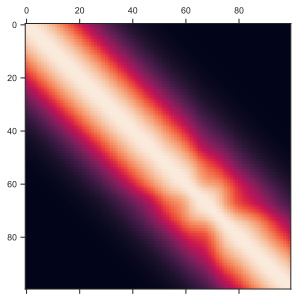

In [44]:
def get_predictive_mean(posterior, train_data, x):
    latent_dist = posterior.predict(x, train_data=train_data)
    predictive_dist = posterior.likelihood(latent_dist)
    return predictive_dist.mean()
get_predictive_mean_partial = lambda x: partial(get_predictive_mean, posterior_low, train_data_low)(x[None]).squeeze(0)
augmented_kernel = AugmentedRBF(lengthscale=jnp.array([1.0, 1.0, 1.0]), variance=jnp.array(1.0), create_extra_dim=get_predictive_mean_partial)

# augmented_kernel(jnp.array([1.0, 2.0]), jnp.array([3.0, 4.0]))
print(get_predictive_mean_partial(jnp.ones(2)))
print(augmented_kernel(jnp.array([1.0, 0.5]), jnp.array([0.5, 1.0])))

x = jnp.linspace(-2.0, 2.0, num=200).reshape(-1, 2)
print(x.shape)

fig, ax = plt.subplots()
ax.matshow(augmented_kernel.gram(x).to_dense());

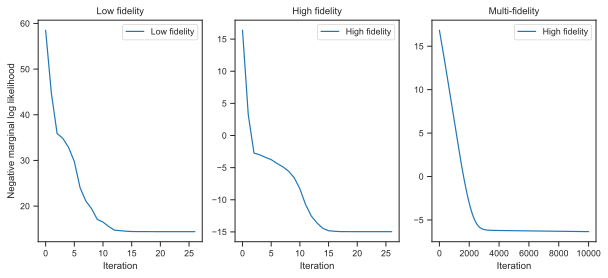

In [38]:
fig, ax = plt.subplots(1, 3, figsize=(10, 4))
ax[0].plot(history_low, label="Low fidelity")
ax[0].set_title("Low fidelity")
ax[0].set_xlabel("Iteration")
ax[0].set_ylabel("Negative marginal log likelihood")
ax[0].legend()

ax[1].plot(history_high, label="High fidelity")
ax[1].set_title("High fidelity")
ax[1].set_xlabel("Iteration")
ax[1].legend()

ax[2].plot(history_multifid, label="High fidelity")
ax[2].set_title("Multi-fidelity")
ax[2].set_xlabel("Iteration")
ax[2].legend()

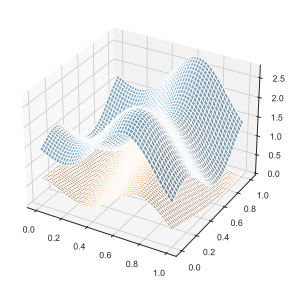

In [47]:
x1_plt, x2_plt = jnp.meshgrid(jnp.linspace(0, 1, 50), jnp.linspace(0, 1, 50))
x_plt_flat = jnp.stack([x1_plt.flatten(), x2_plt.flatten()], axis=-1)
ground_truth_plt = high_fidelity_model(x_plt_flat.T).reshape(x1_plt.shape)

latent_dist_low = posterior_low.predict(x_plt_flat, train_data=Dl)
predictive_dist_low = posterior_low.likelihood(latent_dist_low)

mean_low = predictive_dist_low.mean()
std_low = predictive_dist_low.stddev()
sample_low = predictive_dist_low.sample((), key)

latent_dist_high = posterior_high.predict(x_plt_flat, train_data=Dh)
predictive_dist_high = posterior_high.likelihood(latent_dist_high)

mean_high = predictive_dist_high.mean()
std_high = predictive_dist_high.stddev()
sample_high = predictive_dist_high.sample((), key)

x_test_multifid = jnp.concatenate([x_plt_flat, sample_low[:, None]], axis=-1)
latent_dist_multifid = posterior_multifid.predict(x_test_multifid, train_data=Dh_multifid)
predictive_dist_multifid = posterior_multifid.likelihood(latent_dist_multifid)

mean_multifid = predictive_dist_multifid.mean()
std_multifid = predictive_dist_multifid.stddev()
x_pred_multifid = predictive_dist_multifid.sample((), key)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x1_plt, x2_plt, mean_low.reshape(x1_plt.shape), alpha=0.5)
ax.plot_surface(x1_plt, x2_plt, ground_truth_plt.reshape(x1_plt.shape), alpha=0.5)

Text(0.5, 1.0, 'Multi-fidelity')

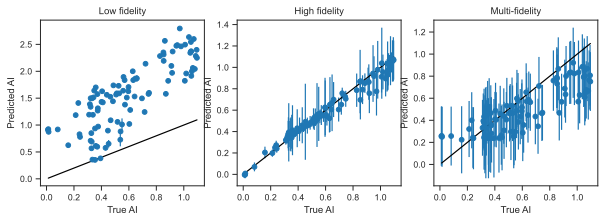

In [29]:
key, key_l, key_h, key_m = jrandom.split(key, 4)

latent_dist_low = posterior_low.predict(x_test, train_data=Dl)
predictive_dist_low = posterior_low.likelihood(latent_dist_low)

mean_low = predictive_dist_low.mean()
std_low = predictive_dist_low.stddev()
sample_low = predictive_dist_low.sample((), key_l)

latent_dist_high = posterior_high.predict(x_test, train_data=Dh)
predictive_dist_high = posterior_high.likelihood(latent_dist_high)

mean_high = predictive_dist_high.mean()
std_high = predictive_dist_high.stddev()
sample_high = predictive_dist_high.sample((), key_h)

x_test_multifid = jnp.concatenate([x_test, sample_low[:, None]], axis=-1)
latent_dist_multifid = posterior_multifid.predict(x_test_multifid, train_data=Dh_multifid)
predictive_dist_multifid = posterior_multifid.likelihood(latent_dist_multifid)

mean_multifid = predictive_dist_multifid.mean()
std_multifid = predictive_dist_multifid.stddev()
x_pred_multifid = predictive_dist_multifid.sample((), key_m)

# Parity plot - add uncertainty on predictions using whiskers
fig, ax = plt.subplots(1, 3, figsize=(10, 3))
ax[0].errorbar(y_test, mean_low, yerr=2 * std_low, fmt="o")
ax[0].plot(y_test, y_test, "k--")
ax[0].set_xlabel("True AI")
ax[0].set_ylabel("Predicted AI")
ax[0].set_title("Low fidelity")

ax[1].errorbar(y_test, mean_high, yerr=2 * std_high, fmt="o")
ax[1].plot(y_test, y_test, "k--")
ax[1].set_xlabel("True AI")
ax[1].set_ylabel("Predicted AI")
ax[1].set_title("High fidelity")

ax[2].errorbar(y_test, mean_multifid, yerr=2 * std_multifid, fmt="o")
ax[2].plot(y_test, y_test, "k--")
ax[2].set_xlabel("True AI")
ax[2].set_ylabel("Predicted AI")
ax[2].set_title("Multi-fidelity")

In [30]:
posterior_l = construct_posterior_gp(Dl, jnp.ones(2), 1.0, 1.0)
posterior_h = construct_posterior_gp(Dh, jnp.ones(2), 1.0, 1.0)

NameError: name 'construct_posterior_gp' is not defined

In [253]:
x1_plt, x2_plt = jnp.meshgrid(jnp.linspace(0, 1, 50), jnp.linspace(0, 1, 50))
x_plt_flat = jnp.stack([x1_plt.flatten(), x2_plt.flatten()], axis=-1)

predictive_dist = construct_predictive_dist(posterior_h, x_plt_flat, Dh)

predictive_mean = predictive_dist.mean()
predictive_std = predictive_dist.stddev()

ground_truth_plt = high_fidelity_model(x_plt_flat.T).reshape(x1_plt.shape)

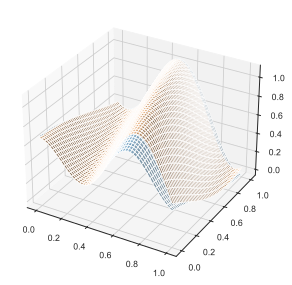

In [254]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x1_plt, x2_plt, predictive_mean.reshape(x1_plt.shape), alpha=0.5)
ax.plot_surface(x1_plt, x2_plt, ground_truth_plt.reshape(x1_plt.shape), alpha=0.5)

In [255]:
predictive_dist_test = construct_predictive_dist(posterior_h, x_test, Dh)
pred_mean = predictive_dist_test.mean()
pred_std = predictive_dist_test.stddev()

In [271]:
# help(predictive_dist_test.sample)
key, subkey = jrandom.split(key)
predictive_dist_test.sample((), subkey).shape

(100,)

Text(0, 0.5, 'Predicted AI')

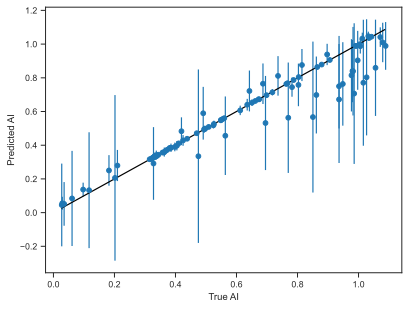

In [256]:
# Parity plot - add uncertainty on predictions using whiskers
fig, ax = plt.subplots()
ax.errorbar(y_test, pred_mean, yerr=2 * pred_std, fmt="o")
ax.plot(y_test, y_test, "k--")
ax.set_xlabel("True AI")
ax.set_ylabel("Predicted AI")

Do normal GP with (1) only low-fidelity data and (2) only high-fidelity data.